In [756]:
from PIL import Image
import numpy as np
from PIL import ImageOps
import matplotlib.pyplot as plt
from PIL import ImageStat as stat

wycinanie fragmentu obrazu - Image.crop(box), gdzie box jest czwórką liczb 

(212, 259) RGB


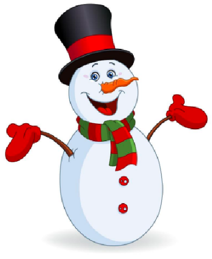

In [757]:
im = Image.open('balwanek.png')
print(im.size, im.mode)
im

wklejanie obrazu w obraz - im.paste(im1, box, mask), gdzie 
im - obraz, do którego wklejamy
im1 - obraz wklejany
box - para liczb (położenie lewego górnego rogu wklejanego obrazu)
mask - maska 

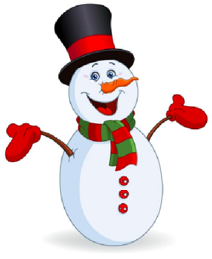

In [758]:
# crop i paste  - dodaj guzik bałwankowi
guzik = (118, 177, 130, 189)
im1 = im.copy()
guz = im.crop(guzik)
im1.paste(guz, (118,190)) # paste - argumenty: obraz wklejany, miejsce wklejenia, ewentualnie maska
im1

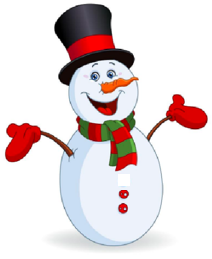

In [759]:
#usun guzik bałwankowi
guzik = (118, 177, 130, 189)
im2 =im1.copy()
new =Image.new('RGB', (guzik[2]-guzik[0], guzik[3]-guzik[1]), (255,255,255)) # tworzy nowy obraz, argumenty: tryb, wymiary obrazu, kolor
im2.paste(new, (118,174))
im2

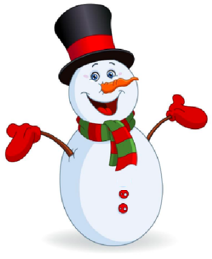

In [760]:
#usun guzik bałwankowi kolor
guzik = (118, 177, 130, 189)
im3 =im1.copy()
tlo = im3.crop((guzik[0]+20, guzik[1], guzik[2]+20, guzik[3]))
#new =Image.new('RGB', (guzik[2]-guzik[0], guzik[3]-guzik[1]), (255,255,255)) # tworzy nowy obraz, argumenty: tryb, wymiary obrazu, kolor
im3.paste(tlo, (118,174))
im3

Zastosowane paste i crop  - przewijanie obrazu z lewej na prawo

In [761]:
def roll(image, delta): 
    xsize, ysize = image.size
    delta = delta % xsize
    if delta == 0: return image
    part1 = image.crop((0, 0, delta, ysize))
    part2 = image.crop((delta, 0, xsize, ysize))
    image.paste(part1, (xsize - delta, 0, xsize, ysize))
    image.paste(part2, (0, 0, xsize - delta, ysize))
    return image

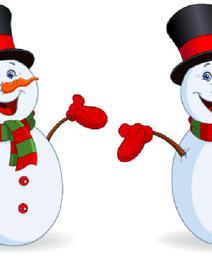

In [762]:
roll(im, 100)

# Tryby obrazów

(588, 772)
RGBA


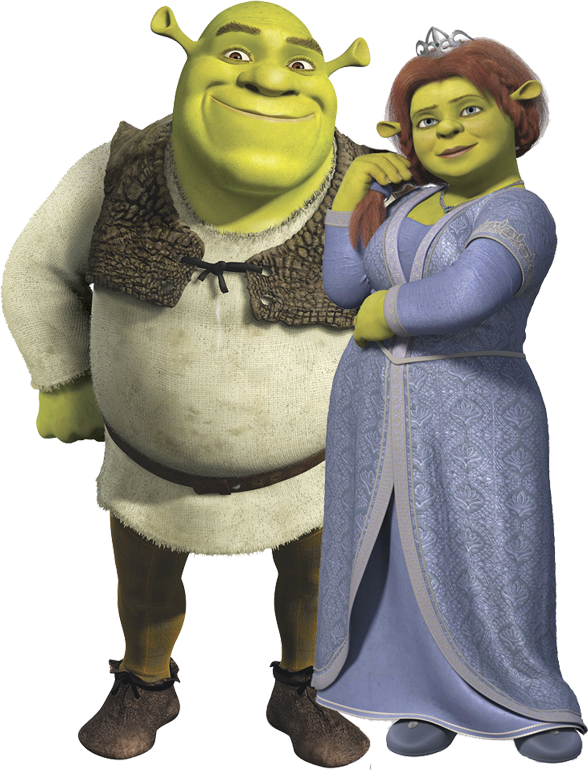

In [763]:
shrek = Image.open("Shrek_Fiona.png")
print(shrek.size)
print(shrek.mode)
shrek

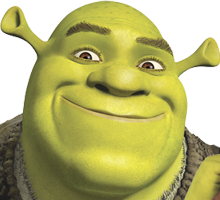

In [764]:
wyc = shrek.crop((150,0,370,200))
wyc



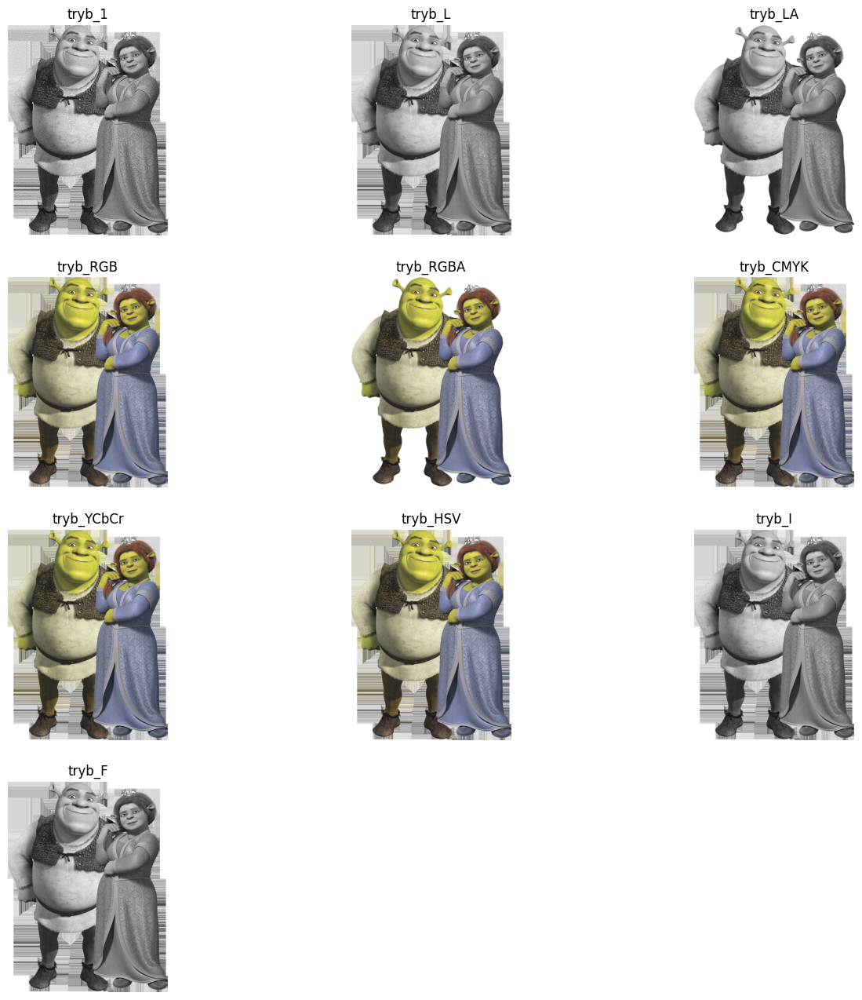

In [765]:
tryby = ['1', 'L', 'LA',  'RGB','RGBA','CMYK','YCbCr','HSV',"I",'F']
plt.figure(figsize=(16, 16))
i=1
for t in tryby:
    file_name = "tryb_"+ str(t)
    im_c = shrek.convert(t)
    plt.subplot(4, 3, i)
    plt.title(str(file_name))
    plt.imshow(im_c, "gray")
    plt.axis('off')
    i +=1
    #im_c.show(file_name)

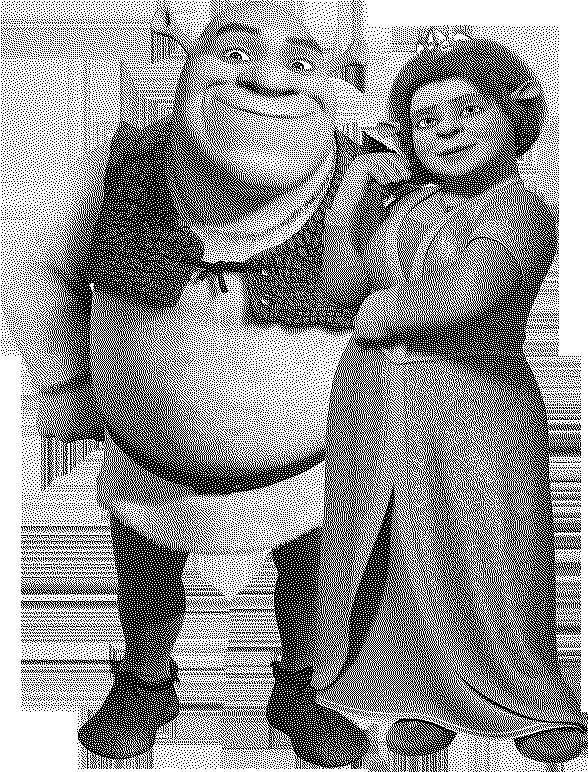

In [766]:
tryb_1 = shrek.convert("1")
tryb_1

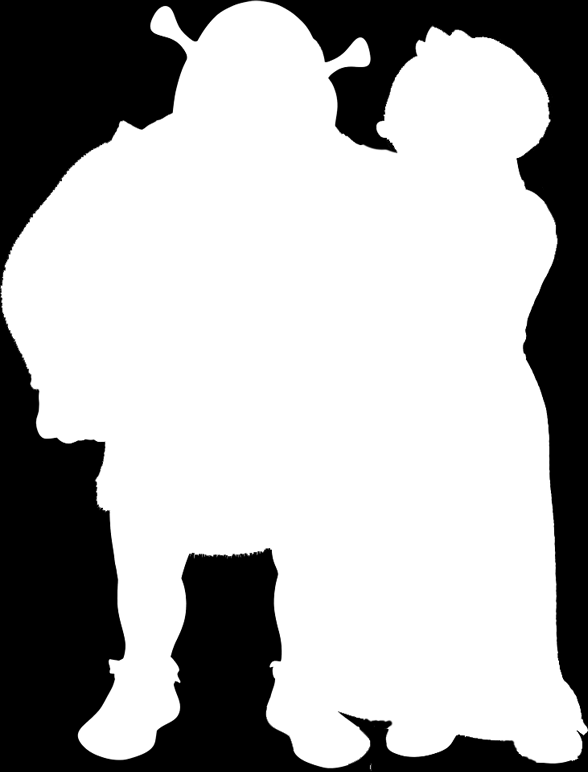

In [767]:
r,g,b,a = shrek.split()
a




paste z maską - wykorzystanie do własnej konwersji na RGB

tryb obrazu:  RGB


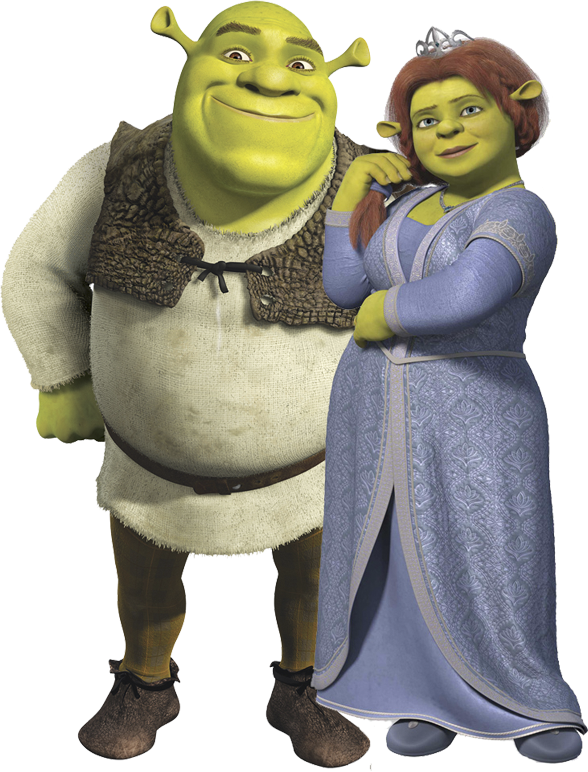

In [768]:
shrek_RGB = Image.new('RGB', shrek.size, (255,255,255)) # nowy obraz wypełniony na biało
shrek_RGB.paste(shrek, (0, 0), a)
print('tryb obrazu: ', shrek_RGB.mode)
shrek_RGB

im.putalpha(im1)   - dodaje lub zastępuje kanal alfa, im1 jest obrazem w trybie 1 lub L

In [769]:
shrek_RGB1 = shrek_RGB.copy()
shrek_RGB1.putalpha(a)
# print(shrek_RGBA.mode)
shrek_RGB1

shrek_RGB1.mode
# a.mode

'RGBA'

(588, 772) (800, 600)
(588, 772) (588, 772)


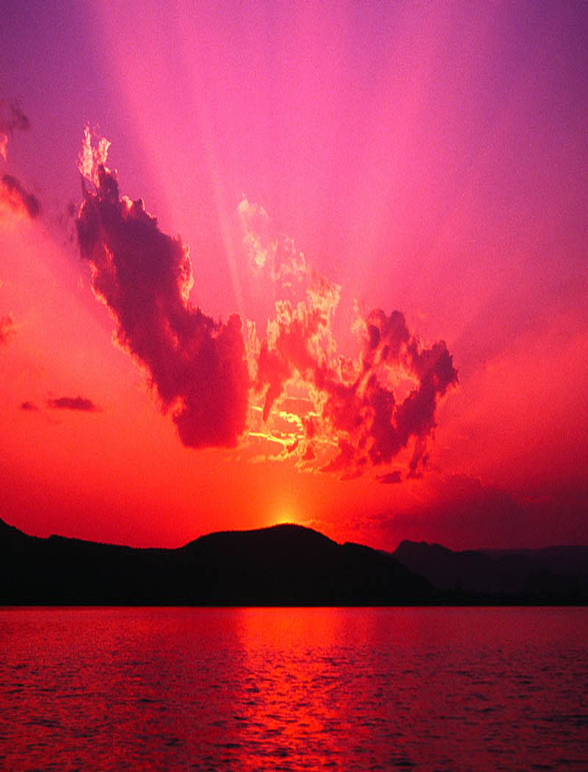

In [770]:
tlo = Image.open('tlo.png')
print(shrek.size, tlo.size)
tlo = tlo.resize(shrek.size, 1)
print(shrek.size, tlo.size)
tlo

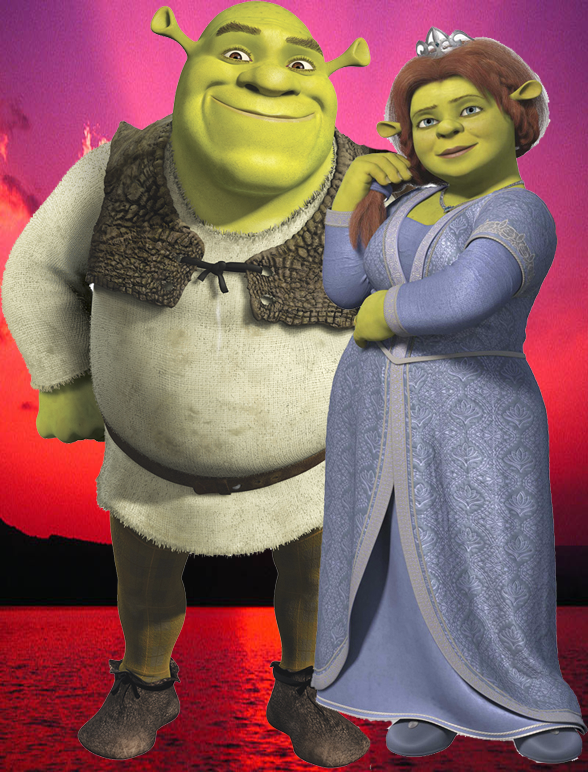

In [771]:
tlo1 = tlo.copy()
tlo1.paste(shrek, (0, 0), a) #shrek wklejony w tlo1 z maska a (kanał alpha obrazu shrek)
tlo1

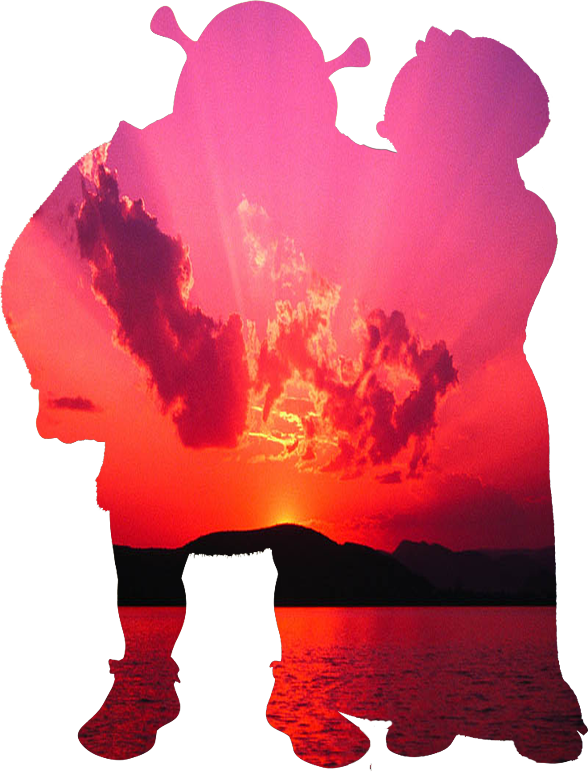

In [772]:
shrek1 = shrek.copy()
shrek1.paste(tlo, (0, 0), a) #  tlo wklejone w shrek1  z maska a
shrek1

tryb motyla RGBA
(1331, 1876)
(588, 772)


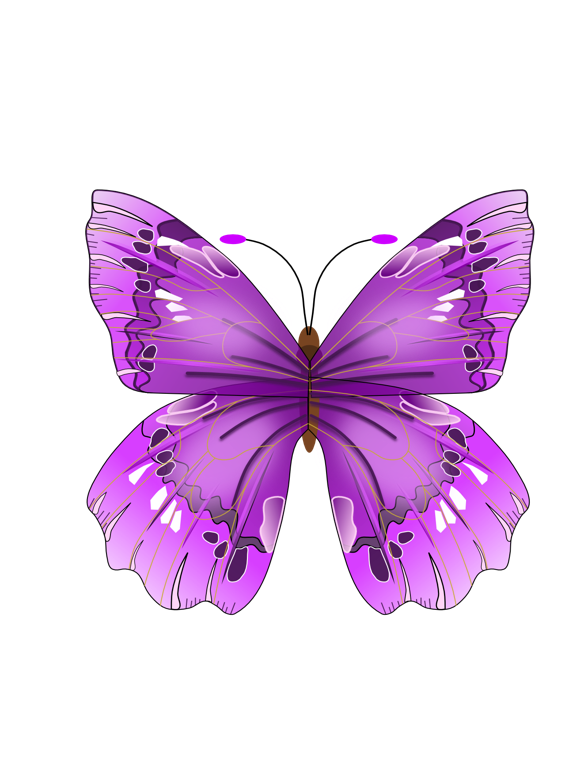

In [773]:
motyl = Image.open('motyl.png')
print("tryb motyla", motyl.mode)
print(motyl.size)
motyl1 = motyl.resize(shrek.size)
print(motyl1.size)
motyl1

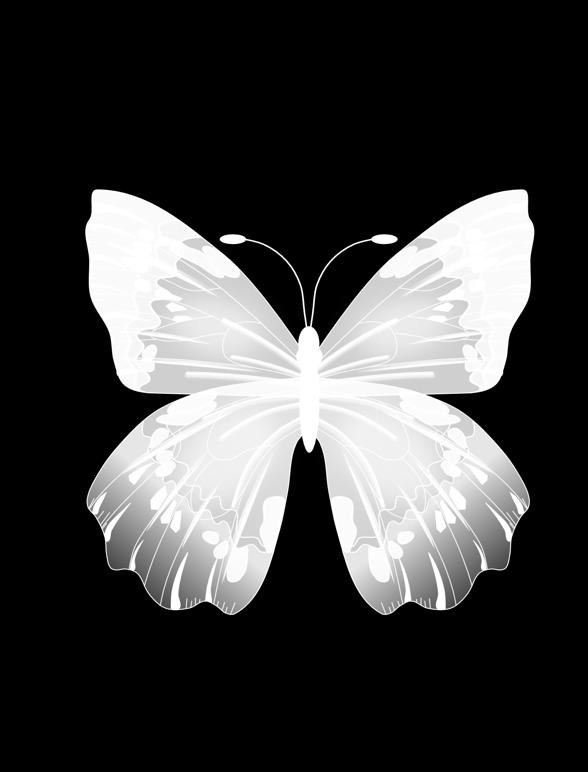

In [774]:
shrek_RGB2 = shrek_RGB.copy()
rm,gm,bm,am = motyl1.split()
am

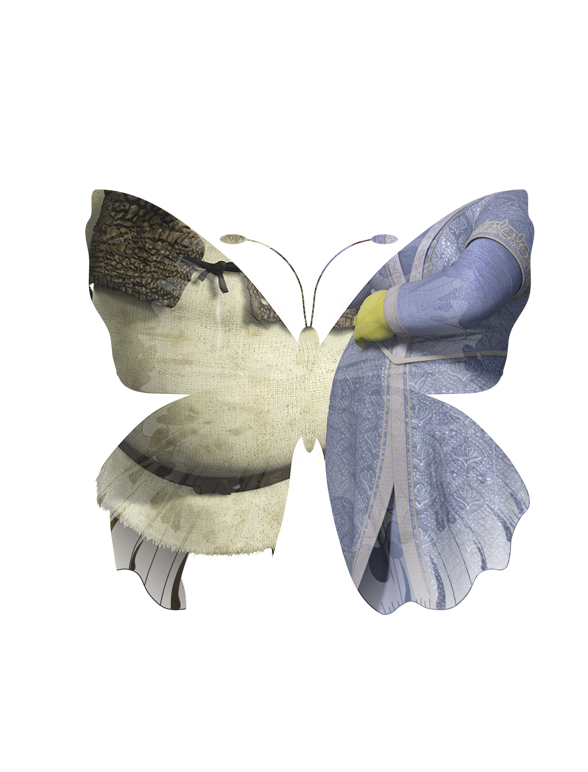

In [775]:
shrek_RGB2 = shrek_RGB.copy()
shrek_RGB2.putalpha(am)

shrek_RGB2

In [776]:
am_neg = ImageOps.invert(am)

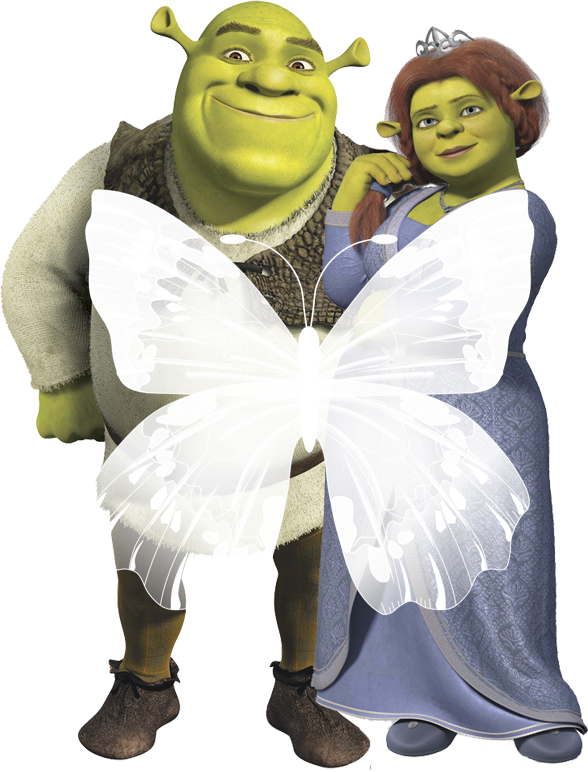

In [777]:
shrek_RGB3 = shrek_RGB.copy()
shrek_RGB3.putalpha(am_neg)
shrek_RGB3

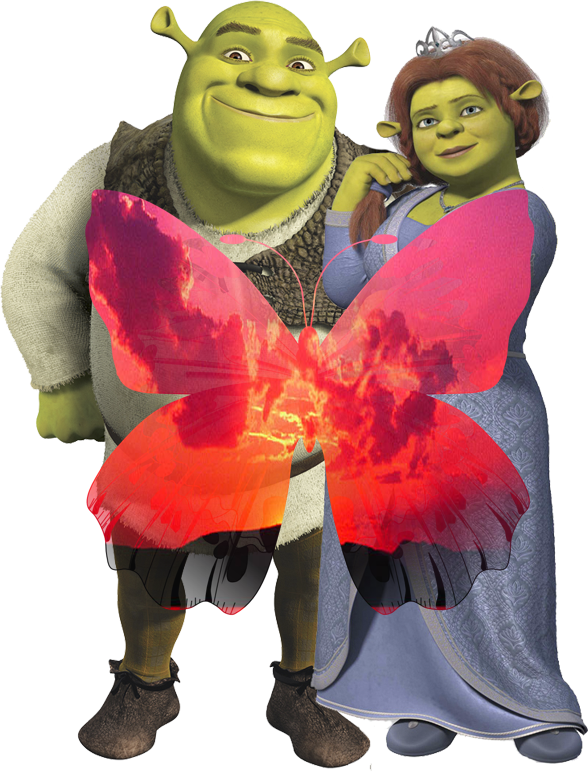

In [778]:
shrek_RGB4 = shrek_RGB.copy()
shrek_RGB4.paste(tlo, (0, 0), motyl1)
shrek_RGB4

kompozycje z maską - Image.composite(im1, im2, maska)
równoważne im2.paste(im1, (0,0), maska)

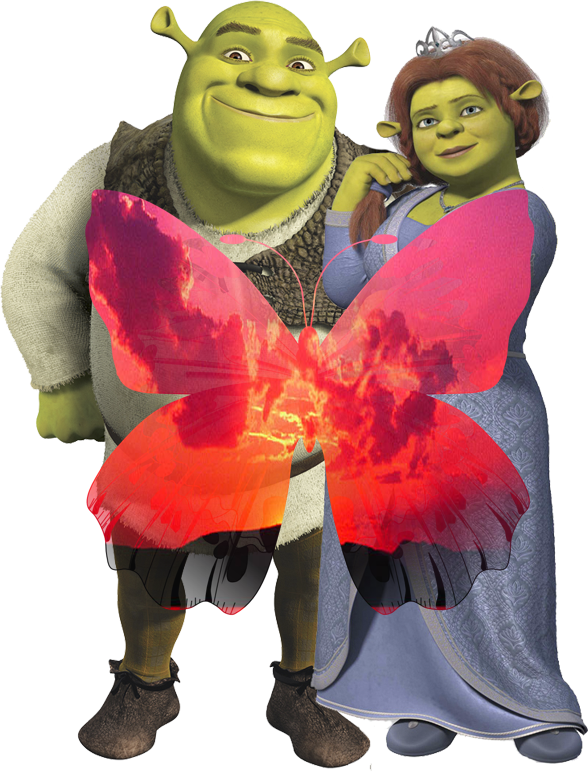

In [779]:
shrek_RGB5 = shrek_RGB.copy()
comp = Image.composite(tlo, shrek_RGB5, am) 
comp

# metoda blend -----mieszanie obrazów
mix = Image.blend(im1, im2, alpha = 0.3) # im1 * (1- alpha ) + im2 * alpha

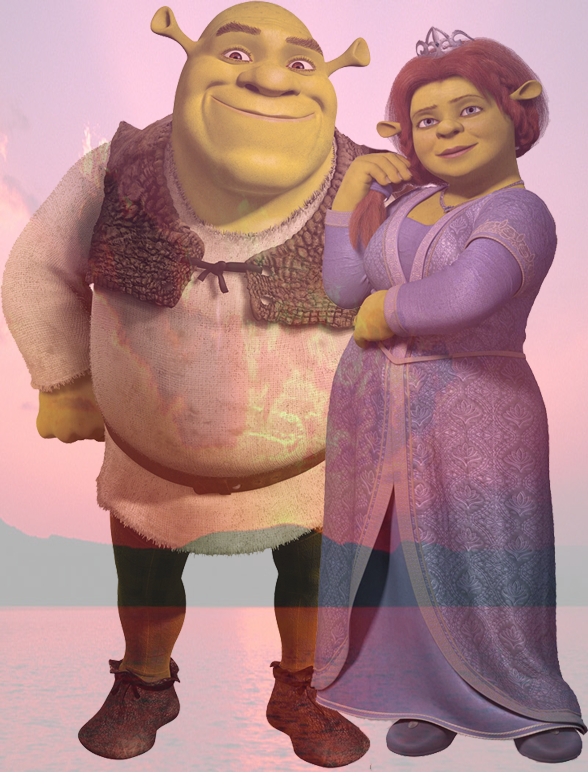

In [780]:
mix = Image.blend(shrek_RGB5, tlo, alpha = 0.3) 
mix


In [781]:
im1 = shrek_RGB.resize((200,300))
im2 = tlo.resize((200,300))

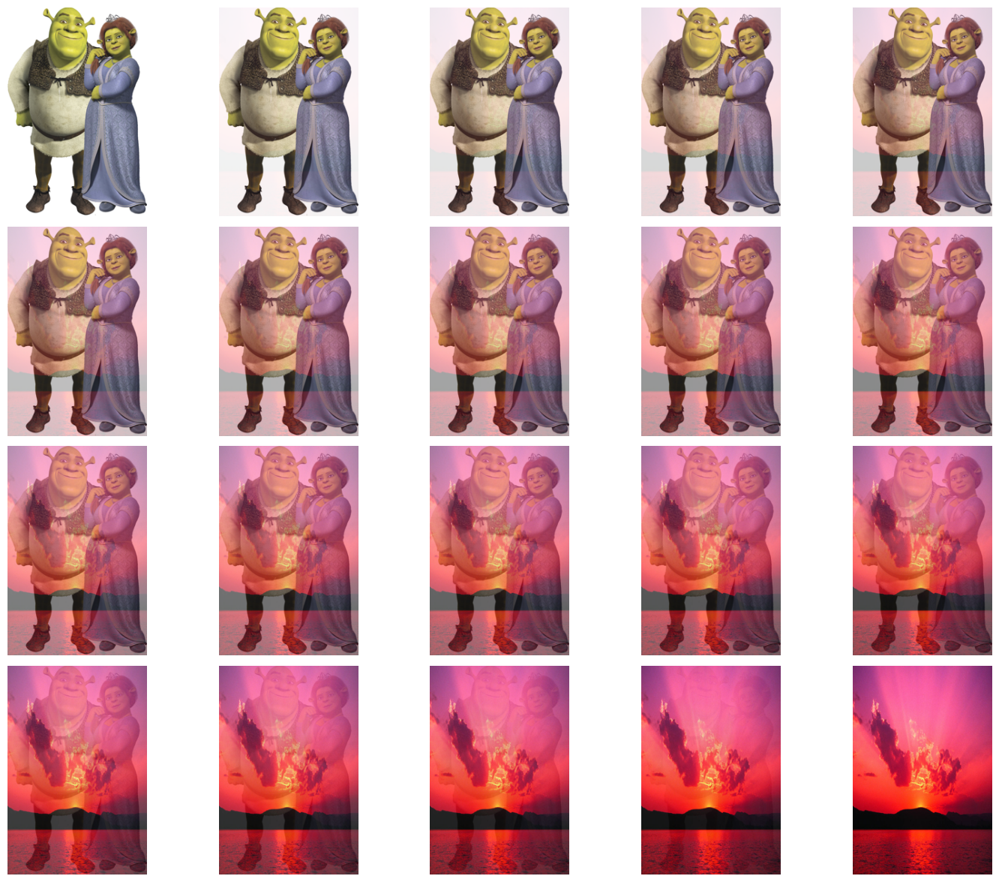

In [782]:
i = 1
plt.figure(figsize=(18,15))
for alfa in np.linspace(0,1,20):
    plt.subplot(4,5,i)
    mix = Image.blend(im1, im2, alpha=alfa)
    plt.imshow(mix)
    plt.axis('off')
    i += 1
plt.subplots_adjust(wspace=0.05, hspace=0.05)
plt.show()